In [229]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import pandas_profiling 
import json
import urllib

%matplotlib inline

In [94]:
import configparser
config = configparser.ConfigParser()
config.read('config.ini')
mapbox_token = config['mapbox']['token']

In [362]:
#import data files 

rainfall = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-07/rainfall.csv',
                      parse_dates={'date': ['year','month','day']},index_col='date')
temp = pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-07/temperature.csv",
                  parse_dates=["date"],index_col="date")
fires = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-07/MODIS_C6_Australia_and_New_Zealand_7d.csv',
                   parse_dates = {'date':['acq_date']},index_col='date')

In [332]:
def clean_df(df):
    
    for col in df.columns: 
        if type(df[col][0]) == str:
            df[col] = df[col].apply(lambda x:x.lower())
            
    return df

def NaN_perc(df):
    
    return 100*df.isna().sum()/df.shape[0]

In [365]:
rainfall = clean_df(rainfall)

In [366]:
rainfall["city_name"].unique()

array(['perth', 'adelaide', 'brisbane', 'sydney', 'canberra', 'melbourne'],
      dtype=object)

In [367]:
rainfall.columns

Index(['station_code', 'city_name', 'rainfall', 'period', 'quality', 'lat',
       'long', 'station_name'],
      dtype='object')

In [368]:
rainfall = rainfall.drop(["station_code","period","station_name","quality"],axis=1)

In [369]:
NaN_perc(rainfall)

city_name    0.000000
rainfall     6.559828
lat          0.000000
long         0.000000
dtype: float64

In [370]:
rainfall.dropna(inplace=True)

In [371]:
temp = clean_df(temp)

In [372]:
temp ["city_name" ] = temp["city_name"].replace(to_replace="port", value="adelaide")

In [373]:
temp = temp[temp["city_name"]!="kent"]

In [380]:
temp["city_name"].unique()

array(['perth', 'adelaide', 'brisbane', 'sydney', 'canberra', 'melbourne'],
      dtype=object)

In [375]:
temp.dropna(inplace=True)

In [376]:
temp = temp[temp["temp_type"]=="max"]
temp = temp.drop(["site_name","temp_type"],axis=1)

In [377]:
rainAndtemp = pd.merge(left = rainfall.reset_index(),
                       right = temp.reset_index(),
                      left_on = ["date","city_name"],
                      right_on = ["date","city_name"])

In [378]:
rainAndtemp = rainAndtemp.set_index(["date","city_name"])
rainAndtemp.sort_index(inplace=True)

In [386]:
rainAndtemp.head()

rainfall    lat    long  temperature
date       city_name                                      
1910-01-02 adelaide        0.0 -34.92  138.60         38.7
           sydney          0.0 -33.86  151.21         25.3
1910-01-03 adelaide        0.0 -34.92  138.60         37.6
           sydney          0.0 -33.86  151.21         31.0
1910-01-04 adelaide        0.0 -34.92  138.60         32.4

In [388]:
adelaide = rainAndtemp.xs("adelaide",level=1)

In [396]:
cities = list(rainAndtemp.index.get_level_values(level=1).unique())

In [418]:
data = rainAndtemp.xs(city,level=1).rolling(window=30).mean()

In [437]:
rainAndtemp.index[-1]

(Timestamp('2019-05-31 00:00:00'), 'sydney')

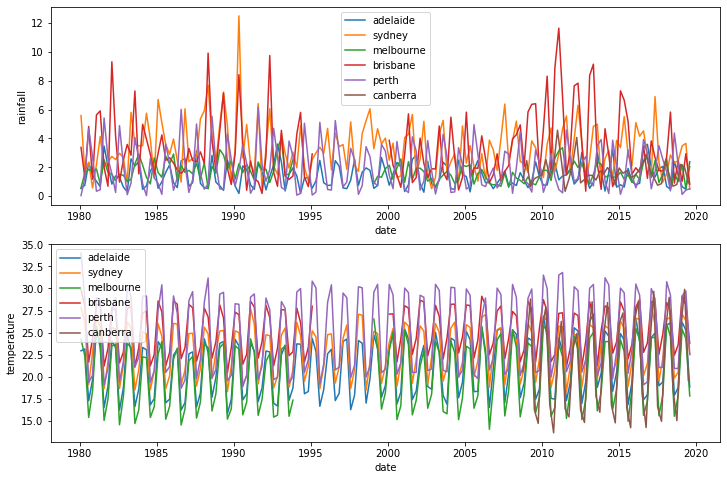

In [438]:
fig,axes = plt.subplots(2,1,figsize=(12,8))
labels = []

for city in cities:
    
    data = rainAndtemp.loc["01-01-1980":"31-05-2019"].xs(city,level=1).resample("3M").mean()
    sns.lineplot(x=data.index, y="rainfall",data=data,ax=axes[0])
    sns.lineplot(x=data.index, y="temperature",data=data,ax=axes[1])
    labels.append(city)
    
axes[0].legend(labels)
axes[1].legend(labels)

In [439]:
fires.head()

,latitude,longitude,brightness,scan,track,acq_time,satellite,confidence,version,bright_t31,frp,daynight
date,,,,,,,,,,,,
2019-12-29,-32.052,151.387,328.0,1.6,1.2,25,T,59,6.0NRT,303.2,38.8,D
2019-12-29,-32.054,151.402,327.2,1.6,1.2,25,T,54,6.0NRT,301.4,39.3,D
2019-12-29,-32.149,151.337,327.1,1.6,1.2,25,T,32,6.0NRT,303.9,32.9,D
2019-12-29,-32.153,151.370,331.4,1.6,1.2,25,T,62,6.0NRT,304.2,39.5,D
2019-12-29,-32.160,151.334,335.5,1.6,1.2,25,T,76,6.0NRT,303.6,55.5,D


In [452]:
fires["size"] = fires["brightness"].apply(lambda x:25*((x-fires["brightness"].min()+1)/(fires["brightness"].max()-fires["brightness"].min())))

In [494]:
day = "2020-01-01"
test = fires.loc[day]

fig = go.Figure(
    go.Scattermapbox(
        lat=test["latitude"],
        lon=test["longitude"],
        mode="markers",
        marker=go.scattermapbox.Marker(
            size=test["size"],
            color = "lightgoldenrodyellow",

        )
    )
)

customdata = test["brightness"]

hovertemplate= """
<extra></extra>
<em>Fire Brightness</em><br>
\U0001F525: %{customdata}
"""

fig.update_layout(
    mapbox = dict(
        style ="dark",
        accesstoken=mapbox_token,
        center=go.layout.mapbox.Center(lat=-25,lon=134.149),
        zoom=2.5), 
    margin = dict(l=0,r=0,t=0,b=0),
    hoverlabel = dict(align="left",font=dict(size=15))
)

fig.update_traces(
    customdata = customdata,
    hovertemplate=hovertemplate)


fig.show()


In [502]:
days = fires.index.unique().tolist()
print(days)

[Timestamp('2019-12-29 00:00:00'), Timestamp('2019-12-30 00:00:00'), Timestamp('2019-12-31 00:00:00'), Timestamp('2020-01-01 00:00:00'), Timestamp('2020-01-02 00:00:00'), Timestamp('2020-01-03 00:00:00'), Timestamp('2020-01-04 00:00:00'), Timestamp('2020-01-05 00:00:00')]


In [518]:
days = fires.index.unique().strftime("%Y-%m-%d").tolist()

frames = [{
    "name":"frame_{}".format(day),
    "data":[{
        "type":"scattermapbox",
        "lat":fires.xs(day)["latitude"],
        "lon":fires.xs(day)["longitude"],
        "marker": go.scattermapbox.Marker(
            size=fires.xs(day)["size"],
            color="lightgoldenrodyellow",
        ),
        "customdata": fires.xs(day)["brightness"],
        "hovertemplate": "<extra></extra><em>Fire Brightness</em><br>\U0001F525: %{customdata}"        
    }],
} for day in days]

In [527]:
sliders = [{
    "transition":{"duration":0},
    "x":0,
    "len":1,
    "currentvalue":{"font":{"size":15},"visible":True,"xanchor":"center"},
    "steps":[
        {
            "label":day,
            "method":"animate",
            "args":[
                ["frame_{}".format(day)],
                {"mode":"immediate","frame":{"duration":1000, "redraw":True},
                "transition":{"duration":50}}
            ],
        } for day in days]
}]

In [535]:
play_button = [{
    "type":"buttons",
    "showactive":True,
    "x":0.5,"y":0,
    "buttons":[{
        "label":'🎬',
        "method":"animate",
        "args":[
            None,
            {
                "frame":{"duration":1000,"redraw":True},
                "transition":{"duration":50},
                "fromcurrent":True,
                "mode":"immediate",
            }
        ]
    }]
}]

In [540]:
data = frames[0]["data"]
title = frames[0]["name"]

layout = go.Layout(
    title = title,
    updatemenus=play_button,
    mapbox={
        "accesstoken":mapbox_token,
        "center":{"lat":-25,"lon":134.149},
        "zoom":2.5,
        "style":"dark"},
    margin=dict(l=0.1,r=0.1,t=0.1,b=0.1),
)

fig = go.Figure(data=data,layout=layout,frames=frames)

fig.show()

In [173]:
mapfire = fires.reset_index()

In [541]:
fig = px.scatter_mapbox(fires,lat="latitude",lon="longitude",color="brightness",
                        hover_data = ["brightness"],color_continuous_scale="YlOrRd_r",
                        animation_frame=fires.index.strftime("%Y-%m-%d"),
                        zoom=2.5,center={"lat":-24.8,"lon":135})

fig.update_layout(mapbox_style="dark",mapbox_accesstoken=mapbox_token,
                 margin=({"r":0,"t":0,"l":0,"b":0}),
                 )
fig.update_traces(marker=dict(
                    size=8,opacity=0.3))

fig.show()

In [31]:
rainfall["quality"].value_counts()

Y    152748
N     14761
Name: quality, dtype: int64

<AxesSubplot:xlabel='lat', ylabel='long'>

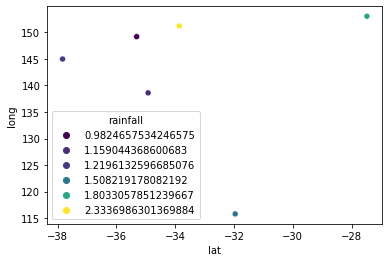

In [26]:
sns.scatterplot(x="lat",y="long",data=rainfall.loc["2019"].groupby("station_name").mean(),hue="rainfall",palette="viridis")

In [70]:
rainfall.loc["2020"].isnull().sum()/rainfall.shape[0]

station_code    0.000000
city_name       0.000000
rainfall        0.000000
period          0.000033
quality         0.000000
lat             0.000000
long            0.000000
station_name    0.000000
dtype: float64

In [13]:
# Cool data exploration package for quick visualization
rainfall.profile_report()